# Food 101
This is a deep learning project. This dataset has 101,000 images for 101 classes. In this project, I tried ResNet50 and DenseNet, and the final model is DenseNet121. Transfer Learning is utilized, and pretrained Model is based on Image Net, which has a good feature extract ability.

Traing Environment: Google Cloud Platform with Nvidia Tesla P100

Accuracy: Top1 84%, Top5 93%

[Paper: Densely Connected Convolutional Networks](https://arxiv.org/abs/1608.06993)

[DataSet: Food101](http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz)


# 1.1 Import Tools

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import time
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

import torch
from torch import nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets, transforms, models
from torch.utils.tensorboard import SummaryWriter

from autoaugment import ImageNetPolicy

# Use GPU if it's available
if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.set_default_tensor_type(torch.cuda.FloatTensor)
else:
    device = torch.device("cpu")
    torch.set_default_tensor_type(torch.FloatTensor)


In [2]:
# Hyper-parameters
num_epochs = 100
learning_rate = 0.01
batch_size = 128

# 1.2 DataSet

In [3]:
data_path = r"/home/joezhou1994001_gmail_com/dataset/food-101"
data_path = r"/home/ec2-user/dataset/food-101"
data_path = r"/Volumes/SD/dataset/food-101"

# TODO: Define transforms for the training data and testing data
train_transforms = transforms.Compose([transforms.RandomRotation(30),
                                       transforms.RandomResizedCrop(224),
                                       transforms.RandomHorizontalFlip(), ImageNetPolicy(),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406],
                                                            [0.229, 0.224, 0.225])])

test_transforms = transforms.Compose([transforms.Resize(255),
                                      transforms.CenterCrop(224),
                                      transforms.ToTensor(),
                                      transforms.Normalize([0.485, 0.456, 0.406],
                                                           [0.229, 0.224, 0.225])])

# Pass transforms in here, then run the next cell to see how the transforms look
train_data = datasets.ImageFolder(data_path + r'/train', transform=train_transforms)
val_data = datasets.ImageFolder(data_path + r'/val', transform=test_transforms)
test_data=datasets.ImageFolder(data_path + r'/test', transform=test_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=128, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=128, shuffle=True)
test_loader=torch.utils.data.DataLoader(test_data, batch_size=64, shuffle=True)

## 2.1 Choose Model

In [4]:
# DenseNet121
model =models.densenet121(pretrained=True)

# ResNet
# model =models.resnet(50)(pretrained=True)

# model

## 2.2 Model Validation

In [36]:
######################################################
# Run this block first time you run, 
# for validation purpose, make sure the model works.
######################################################


# Freeze parameters so we don't backprop through them
# 固定住已经训练好的参数
for param in model.parameters():
    param.requires_grad = False

# Edit the last full connection layer   1024 -> 500 -> 101
from collections import OrderedDict
classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(1024, 500)),
                          ('relu', nn.ReLU()),
                          ('fc2', nn.Linear(500, 101)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))

model.classifier = classifier
model.to(device)

criterion = nn.NLLLoss()
optimizer = torch.optim.Adam(model.classifier.parameters(), lr=0.001)

for ii, (inputs, labels) in enumerate(train_loader):
    # Move input and label tensors to the GPU
    inputs, labels = inputs.to(device), labels.to(device)

    start = time.time()

    outputs = model.forward(inputs)
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()

    if ii==3:
        break

print(f"Device = {device}; Time per batch: {(time.time() - start)/3:.3f} seconds")

Device = cuda; Time per batch: 0.010 seconds


## 2.3 Adjust Model
Last layer of retrained model is [1024, 1000]. Here we have 101 classes, so change it.

In [5]:
#model = models.densenet201(pretrained=True)
model.to(device)

# Freeze parameters so we don't backprop through them
for param in model.parameters():
    param.requires_grad = False

model.classifier = nn.Sequential(
                                nn.Linear(1024,512), 
                                nn.LeakyReLU(), 
                                nn.Linear(512,256),
                                nn.LeakyReLU(), 
                                nn.Linear(256,101)
                            )

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.classifier.parameters(), lr=0.001, betas=[0.9, 0.999])

## 3.1 Train Model

In [6]:
from torch.utils.tensorboard import SummaryWriter

def train(num_epochs,train_loader,test_loader, resnet, optimizer, criterion):
    """
    Returns trained model
    """
    # Record Loss and Accuracy to tensorboard. Default logdir is runs
    writer = SummaryWriter()
    start = time.time()
    
    # initialize tracker for minimum validation loss.
    test_loss_min = np.Inf
    step = 0
    total_step = len(train_loader)
    for epoch in range(num_epochs):
        ################################################
        #
        #     Training Mode
        #
        ###############################################
        model.train()
        train_loss=0
        for i, data in enumerate(train_loader):
            inputs, labels = data[0].to(device), data[1].to(device)
  
            # Forward
            outputs = resnet(inputs)
            loss = criterion(outputs, labels)

            # Backward
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            # Loss/Accuracy
            train_loss += loss.item()
            _, argmax = torch.max(outputs, 1)
            accuracy = (labels == argmax.squeeze()).float().mean()
            
            # Print Train Accuracy/Loss every 100 steps.
            if (i+1) %100 == 0:     
                time_cost = time.time()-start
                print ('Train: Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuray: {}, Time:{}'.format(epoch+1, num_epochs, i+1, total_step, loss.item(), accuracy.item(), time_cost))
    
                writer.add_scalar('Loss/train', loss.item(), step)
                writer.add_scalar('Accuracy/train', accuracy, step)
                step += 100

        # Save the newest model. According to testing accuracy record. we can find the best model in history.
        torch.save(model.state_dict(), 'models/temp/food101_{}.pth'.format(time.time()))

        
        ################################################
        #
        #     Testing Mode
        #
        ###############################################
        model.eval()
        test_loss = 0
        test_accuracy = 0
        test_step = 0
        with torch.no_grad():
            for i, data in enumerate(test_loader):
                # For testing purpost, only calculate first 30 batches.
                # if i == 30: break
                images, labels = data[0].to(device), data[1].to(device)

                # Forward
                outputs = model(images)
                batch_loss = criterion(outputs, labels)
                test_loss += batch_loss.item()
                
                # Get topk predition. 预测中topk
                top_p, top_class = outputs.topk(5, dim=1)
                labels = labels.view(-1,1)        #  [n] 转为 [n, 1] , 以便与 [n, 5] 做比较    

                # Is right answer in topk?   判断topk中是否判断正确
                results =  top_class == labels # tensor([[False, False, False,  True, False],  [False,  True, False, False, False], ....)
                results = results.sum(1)          # tensor([1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]), 每一行只要有一个为True就返回1, dim=1表示对维度1求和

                # Calculate average accuracy. 每一个batch有一个Accuracy, 最后除以batch数, 求平均
                test_accuracy += torch.mean(results.float()).item()

        # Avg Accuracy/Loss for each epoch
        avg_test_accuracy = test_accuracy/(i+1)
        avg_test_loss = test_loss/(i+1)
        time_cost = time.time()-start
        print ('Test: Epoch [{}/{}], Loss: {:.4f}, Accuray Top5: {:.3%}, Time:{}'.format(epoch+1, num_epochs, avg_test_loss, avg_test_accuracy, time_cost))

        # Record testing result in tensorboard.
        writer.add_scalar('Loss/test', avg_test_loss, epoch)
        writer.add_scalar('Accuracy/test', avg_test_accuracy, epoch)
        
        # Save the model with lower loss.
        if test_loss <= test_loss_min:
            print("Saved Model with Lower Loss")
            torch.save(model.state_dict(),'models/food101_less_loss.pth')
            test_loss_min=avg_test_loss

        # End Testing Mode
        model.train()

In [9]:
train(100, train_loader, test_loader, model, optimizer, criterion)

Train: Epoch [1/100], Step [100/474], Loss: 2.2092, Accuray: 0.453125, Time:545.367484331131
Train: Epoch [1/100], Step [200/474], Loss: 2.2136, Accuray: 0.453125, Time:1080.565059185028
Train: Epoch [1/100], Step [300/474], Loss: 1.9564, Accuray: 0.53125, Time:1614.4209067821503
Train: Epoch [1/100], Step [400/474], Loss: 2.5359, Accuray: 0.3671875, Time:2139.187469482422
Test: Epoch [1/100], Loss: 1.5376, Accuray Top5: 84.219%, Time:3281.716363430023
Saved Model with Lower Loss
Train: Epoch [2/100], Step [100/474], Loss: 2.2630, Accuray: 0.4453125, Time:3395.1930632591248
Train: Epoch [2/100], Step [200/474], Loss: 2.1683, Accuray: 0.4375, Time:3507.8141384124756
Train: Epoch [2/100], Step [300/474], Loss: 2.3438, Accuray: 0.40625, Time:3620.5777819156647
Train: Epoch [2/100], Step [400/474], Loss: 2.0748, Accuray: 0.5, Time:3733.498116016388
Test: Epoch [2/100], Loss: 1.5521, Accuray Top5: 83.955%, Time:3980.749472141266
Train: Epoch [3/100], Step [100/474], Loss: 1.8954, Accuray: 0

Test: Epoch [18/100], Loss: 1.5660, Accuray Top5: 83.886%, Time:15034.784904956818
Train: Epoch [19/100], Step [100/474], Loss: 1.8756, Accuray: 0.5234375, Time:15145.674757003784
Train: Epoch [19/100], Step [200/474], Loss: 2.1428, Accuray: 0.484375, Time:15257.256936788559
Train: Epoch [19/100], Step [300/474], Loss: 2.2422, Accuray: 0.46875, Time:15367.569503068924
Train: Epoch [19/100], Step [400/474], Loss: 1.9930, Accuray: 0.4921875, Time:15478.748666286469
Test: Epoch [19/100], Loss: 1.5515, Accuray Top5: 84.086%, Time:15721.953993558884
Train: Epoch [20/100], Step [100/474], Loss: 2.0082, Accuray: 0.515625, Time:15832.904603719711
Train: Epoch [20/100], Step [200/474], Loss: 2.1381, Accuray: 0.5, Time:15943.420501947403
Train: Epoch [20/100], Step [300/474], Loss: 2.2798, Accuray: 0.5078125, Time:16054.247993946075
Train: Epoch [20/100], Step [400/474], Loss: 2.4338, Accuray: 0.4296875, Time:16164.954780101776
Test: Epoch [20/100], Loss: 1.5451, Accuray Top5: 83.937%, Time:1640

Train: Epoch [36/100], Step [400/474], Loss: 1.7852, Accuray: 0.5625, Time:27246.31538438797
Test: Epoch [36/100], Loss: 1.5486, Accuray Top5: 83.966%, Time:27491.624095201492
Train: Epoch [37/100], Step [100/474], Loss: 1.9501, Accuray: 0.53125, Time:27603.412558555603
Train: Epoch [37/100], Step [200/474], Loss: 2.1477, Accuray: 0.4765625, Time:27714.760132551193
Train: Epoch [37/100], Step [300/474], Loss: 2.2471, Accuray: 0.46875, Time:27826.624513864517
Train: Epoch [37/100], Step [400/474], Loss: 2.0698, Accuray: 0.5078125, Time:27938.198852300644
Test: Epoch [37/100], Loss: 1.5486, Accuray Top5: 83.930%, Time:28185.477843999863
Train: Epoch [38/100], Step [100/474], Loss: 2.0167, Accuray: 0.53125, Time:28297.92029929161
Train: Epoch [38/100], Step [200/474], Loss: 2.2052, Accuray: 0.5, Time:28410.147056102753
Train: Epoch [38/100], Step [300/474], Loss: 2.0906, Accuray: 0.4140625, Time:28522.46834206581
Train: Epoch [38/100], Step [400/474], Loss: 2.1424, Accuray: 0.4765625, Tim

Train: Epoch [54/100], Step [300/474], Loss: 2.1799, Accuray: 0.453125, Time:39893.98636460304
Train: Epoch [54/100], Step [400/474], Loss: 2.0468, Accuray: 0.4921875, Time:40007.118894815445
Test: Epoch [54/100], Loss: 1.5282, Accuray Top5: 84.563%, Time:40256.62089705467
Train: Epoch [55/100], Step [100/474], Loss: 2.0626, Accuray: 0.484375, Time:40369.76272249222
Train: Epoch [55/100], Step [200/474], Loss: 2.1050, Accuray: 0.453125, Time:40482.58551669121
Train: Epoch [55/100], Step [300/474], Loss: 2.2253, Accuray: 0.4375, Time:40595.61470580101
Train: Epoch [55/100], Step [400/474], Loss: 2.0323, Accuray: 0.53125, Time:40708.55739068985
Test: Epoch [55/100], Loss: 1.5423, Accuray Top5: 84.240%, Time:40958.06192588806
Train: Epoch [56/100], Step [100/474], Loss: 1.9444, Accuray: 0.515625, Time:41071.23809957504
Train: Epoch [56/100], Step [200/474], Loss: 2.0499, Accuray: 0.4765625, Time:41183.5567278862
Train: Epoch [56/100], Step [300/474], Loss: 2.2172, Accuray: 0.4453125, Time

Train: Epoch [72/100], Step [200/474], Loss: 2.0942, Accuray: 0.4453125, Time:52320.281158447266
Train: Epoch [72/100], Step [300/474], Loss: 1.9534, Accuray: 0.5390625, Time:52434.623876810074
Train: Epoch [72/100], Step [400/474], Loss: 1.9673, Accuray: 0.5078125, Time:52548.488792181015
Test: Epoch [72/100], Loss: 1.5547, Accuray Top5: 84.137%, Time:52799.366473436356
Train: Epoch [73/100], Step [100/474], Loss: 2.3106, Accuray: 0.453125, Time:52913.853283405304
Train: Epoch [73/100], Step [200/474], Loss: 1.8542, Accuray: 0.53125, Time:53027.6520447731
Train: Epoch [73/100], Step [300/474], Loss: 1.8605, Accuray: 0.5625, Time:53140.62022805214
Train: Epoch [73/100], Step [400/474], Loss: 2.0485, Accuray: 0.453125, Time:53253.18365955353
Test: Epoch [73/100], Loss: 1.5507, Accuray Top5: 84.264%, Time:53500.62557601929
Train: Epoch [74/100], Step [100/474], Loss: 2.0771, Accuray: 0.453125, Time:53612.96114873886
Train: Epoch [74/100], Step [200/474], Loss: 2.0293, Accuray: 0.484375, 

Train: Epoch [90/100], Step [100/474], Loss: 1.8845, Accuray: 0.5078125, Time:64918.64334774017
Train: Epoch [90/100], Step [200/474], Loss: 2.1139, Accuray: 0.453125, Time:65036.392708063126
Train: Epoch [90/100], Step [300/474], Loss: 2.0196, Accuray: 0.4453125, Time:65153.50872206688
Train: Epoch [90/100], Step [400/474], Loss: 1.9257, Accuray: 0.5546875, Time:65270.405084848404
Test: Epoch [90/100], Loss: 1.5422, Accuray Top5: 84.469%, Time:65527.09473609924
Train: Epoch [91/100], Step [100/474], Loss: 2.0739, Accuray: 0.46875, Time:65642.91249632835
Train: Epoch [91/100], Step [200/474], Loss: 2.1518, Accuray: 0.4765625, Time:65758.75939536095
Train: Epoch [91/100], Step [300/474], Loss: 2.1157, Accuray: 0.46875, Time:65874.57527804375
Train: Epoch [91/100], Step [400/474], Loss: 2.0264, Accuray: 0.4296875, Time:65991.7126801014
Test: Epoch [91/100], Loss: 1.5410, Accuray Top5: 84.469%, Time:66247.33048582077
Train: Epoch [92/100], Step [100/474], Loss: 2.0971, Accuray: 0.5, Time:

# 4.1 Save Model 
Here we always save the most recent model.

In [10]:
torch.save(model.state_dict(), 'models/temp/food101_{}.pth'.format(time.time()))

# 4.2 Load Model

In [11]:
# Most recent model: food101_model01/.pth 是最新模型
# model.load_state_dict(torch.load('models/food101_model01.pth', map_location=device)

# Model with lowest loss: food101_less_loss.pth 是当前拥有最低loss的模型
model.load_state_dict(torch.load('models/food101_less_loss.pth', map_location=device))

<All keys matched successfully>

# 5 Test Model

In [14]:
model.eval()
start = time.time()

test_loss_min = np.Inf
test_loss=0
test_accuracy=0
with torch.no_grad():
    for i, data in enumerate(test_loader):
        # if i == 30: break

        images, labels = data[0].to(device), data[1].to(device)
        
        # Forward
        outputs = model(images)
        batch_loss = criterion(outputs, labels)
        test_loss += batch_loss.item()

        # Topk
        top_p, top_class = outputs.topk(5, dim=1)
        labels = labels.view(-1,1)        #  [n] 转为 [n, 1] , 以便与 [n, 5] 做比较    
        
        # Predict correctly?
        results =  top_class == labels # tensor([[False, False, False,  True, False],  [False,  True, False, False, False], ....)
        results = results.sum(1)          # tensor([1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]), 每一行只要有一个为True就返回1, dim=1表示对维度1求和
        
        # Avg accuracy / Loss
        test_accuracy += torch.mean(results.float()).item()
        avg_test_accuracy = test_accuracy/(i+1)
        avg_test_loss = test_loss/(i+1)
        
        time_cost = time.time()-start
        print ('Test: Step [{}/{}], Loss: {:.4f}, Accuray Top5: {:.3%}, Time:{}'.format(i+1, len(test_loader), avg_test_loss, avg_test_accuracy, time_cost))

# End testing
model.train()
print('Finish Testing')

Test: Step [316/316], Loss: {1.0986873224}, Accuray Top5: {93.944%}, Time:{148.238746823}
Finish Testing


# 5 Case Test

In [15]:
from PIL import Image
# list of class names by index, i.e. a name can be accessed like class_names[0]
#class_names = [item[4:] for item in train_data.classes]


def predict(img_path, topk=5):
    """
    给定一张图的路径, 对其类别进行预测
    given a img, predict its class.
    """
    model.eval()
    
    # preprocess img. 按指定格式对图片进行压缩处理
    img = Image.open(img_path)
    img = test_transforms(img)

    # img: [3, 224, 224]
    # 因为model接受batch的维度是[n, 3, 224, 224], 所以要在最前面增加一维度
    img = torch.unsqueeze(img, 0)
    
    # Predict top5
    outputs = torch.exp(model(img.to(device)))
    top_p, top_class = outputs.topk(topk, dim=1)

    pred = top_class.data.cpu().numpy()[0]
    results = [train_data.classes[i] for i in pred]
    return results

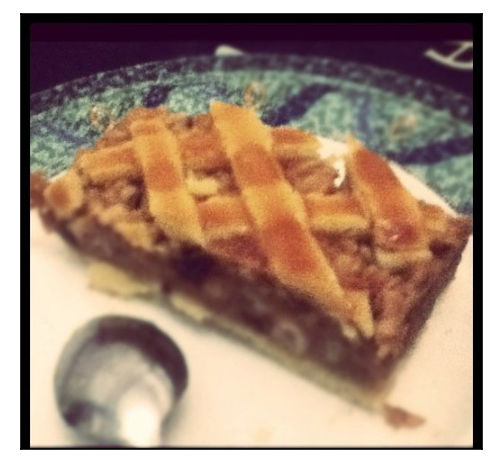

Predict:\<b\>a\<b\/\> ['waffles', 'apple_pie', 'gyoza', 'pancakes', 'baklava']


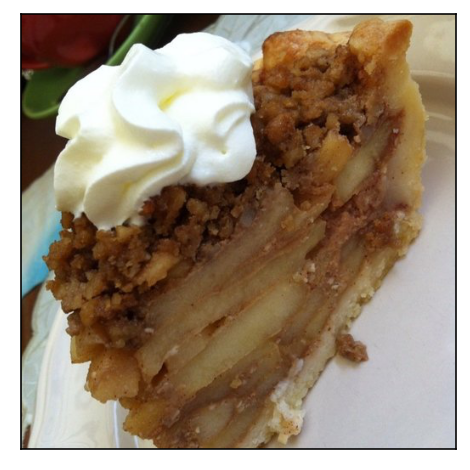

Predict:\<b\>a\<b\/\> ['carrot_cake', 'chocolate_cake', 'frozen_yogurt', 'red_velvet_cake', 'apple_pie']


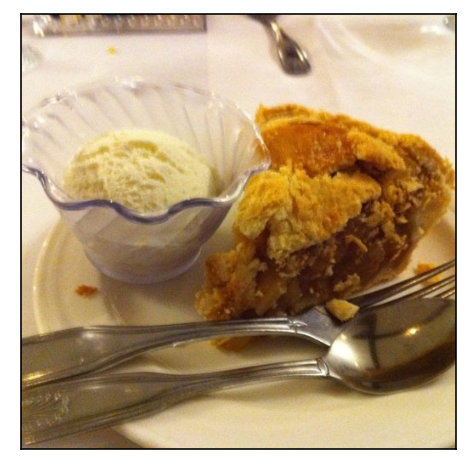

Predict:\<b\>a\<b\/\> ['apple_pie', 'carrot_cake', 'bread_pudding', 'baklava', 'chicken_curry']


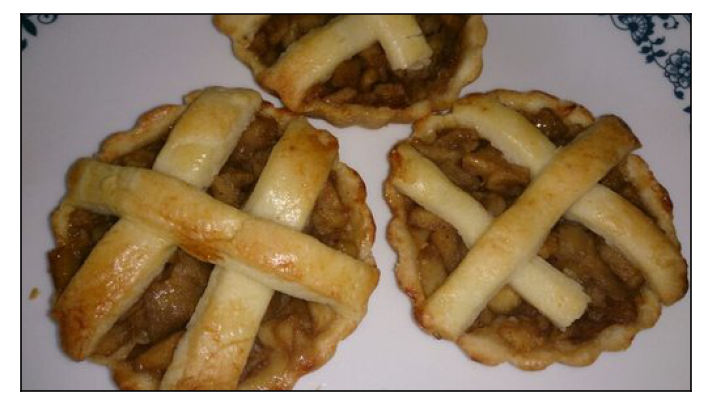

Predict:\<b\>a\<b\/\> ['poutine', 'fried_calamari', 'macaroni_and_cheese', 'gnocchi', 'scallops']


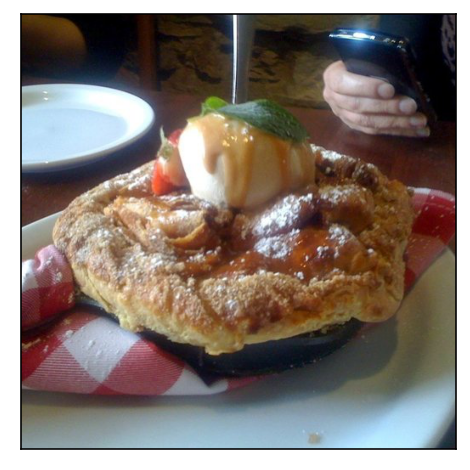

Predict:\<b\>a\<b\/\> ['french_toast', 'grilled_cheese_sandwich', 'omelette', 'pancakes', 'pork_chop']


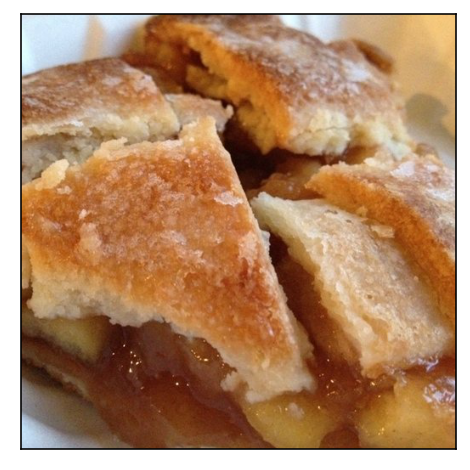

Predict:\<b\>a\<b\/\> ['apple_pie', 'grilled_cheese_sandwich', 'french_toast', 'waffles', 'garlic_bread']


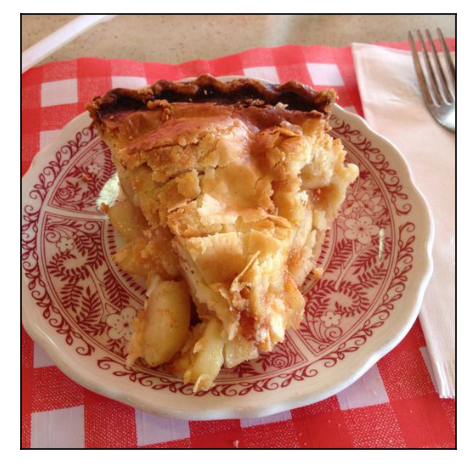

Predict:\<b\>a\<b\/\> ['apple_pie', 'bread_pudding', 'gyoza', 'samosa', 'peking_duck']


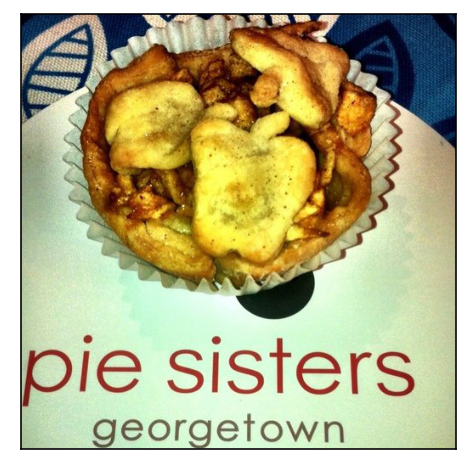

Predict:\<b\>a\<b\/\> ['apple_pie', 'bread_pudding', 'gnocchi', 'waffles', 'macaroni_and_cheese']


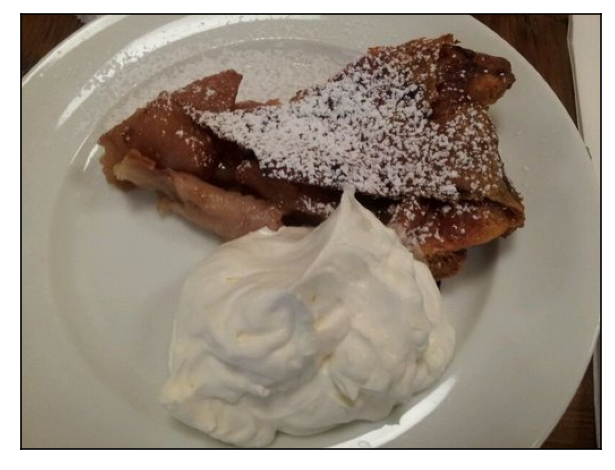

Predict:\<b\>a\<b\/\> ['pancakes', 'french_toast', 'peking_duck', 'hamburger', 'beignets']


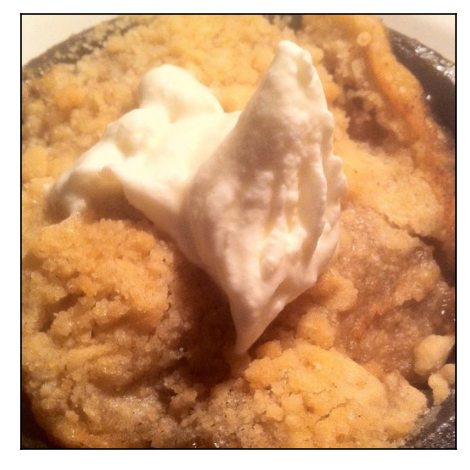

Predict:\<b\>a\<b\/\> ['cannoli', 'frozen_yogurt', 'falafel', 'samosa', 'escargots']


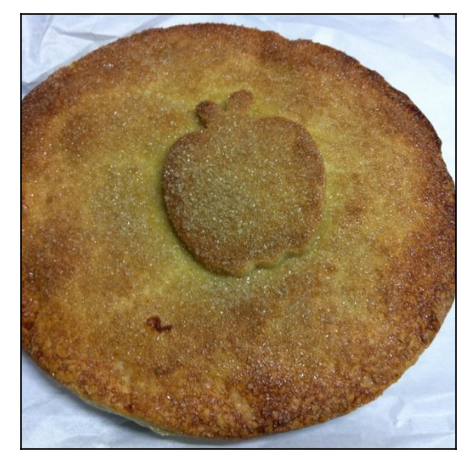

Predict:\<b\>a\<b\/\> ['apple_pie', 'pancakes', 'creme_brulee', 'donuts', 'beignets']


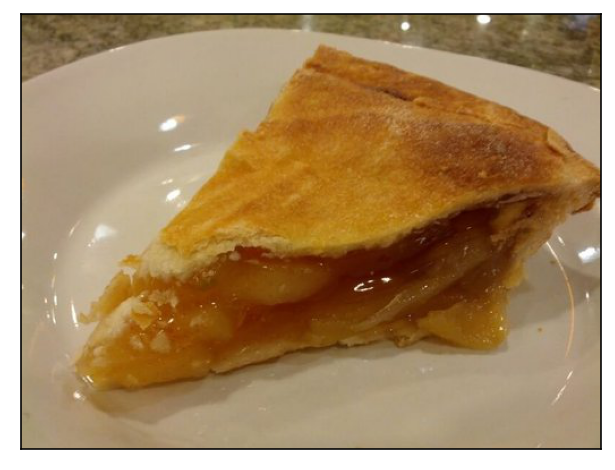

Predict:\<b\>a\<b\/\> ['apple_pie', 'baklava', 'peking_duck', 'gyoza', 'pancakes']


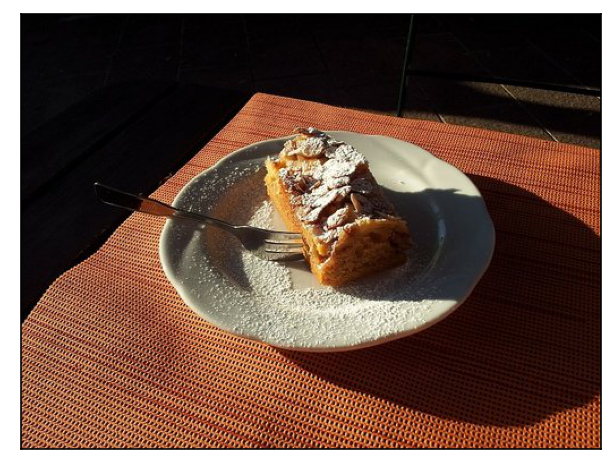

Predict:\<b\>a\<b\/\> ['tiramisu', 'chocolate_mousse', 'apple_pie', 'bread_pudding', 'cannoli']


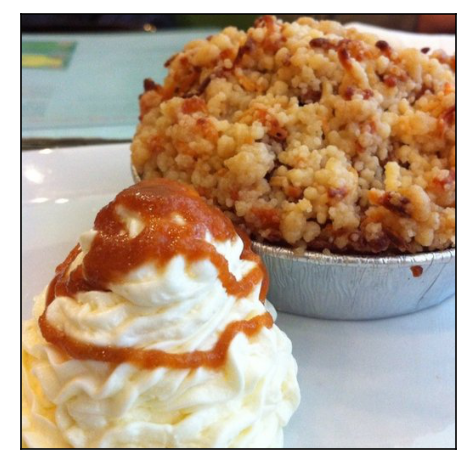

Predict:\<b\>a\<b\/\> ['apple_pie', 'pancakes', 'waffles', 'carrot_cake', 'bread_pudding']


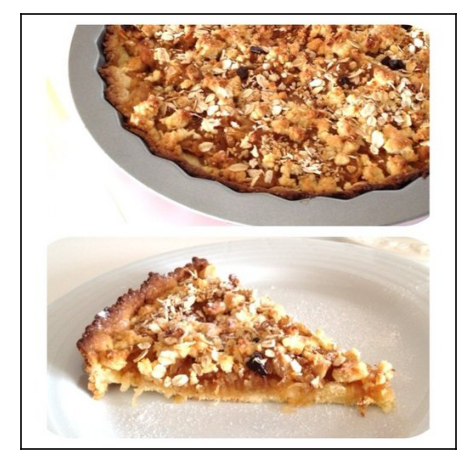

Predict:\<b\>a\<b\/\> ['gnocchi', 'carrot_cake', 'macaroni_and_cheese', 'apple_pie', 'risotto']


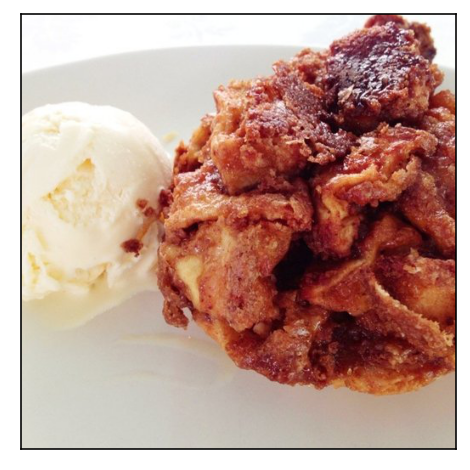

Predict:\<b\>a\<b\/\> ['bread_pudding', 'apple_pie', 'lasagna', 'tiramisu', 'gnocchi']


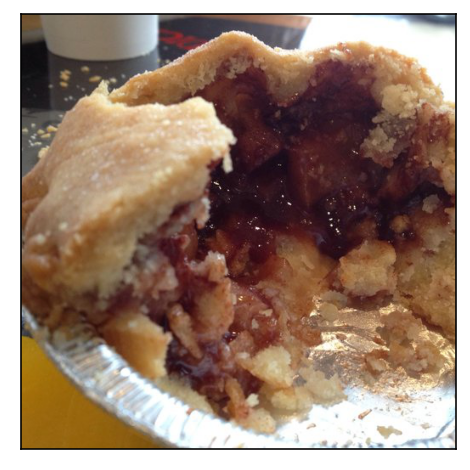

Predict:\<b\>a\<b\/\> ['breakfast_burrito', 'samosa', 'apple_pie', 'bread_pudding', 'baklava']


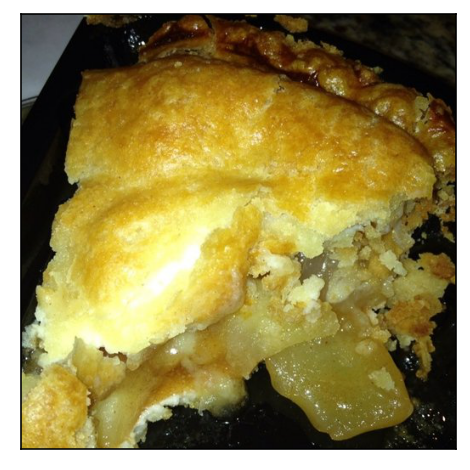

Predict:\<b\>a\<b\/\> ['apple_pie', 'hamburger', 'baklava', 'pancakes', 'garlic_bread']


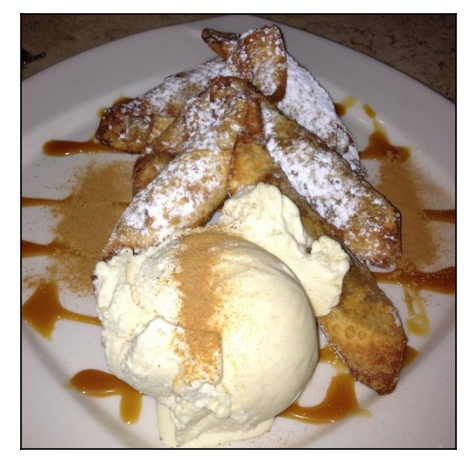

Predict:\<b\>a\<b\/\> ['beignets', 'cannoli', 'bread_pudding', 'waffles', 'french_toast']


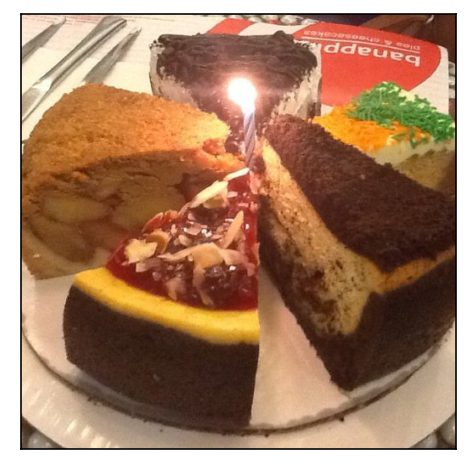

Predict:\<b\>a\<b\/\> ['tiramisu', 'chocolate_cake', 'chocolate_mousse', 'carrot_cake', 'cheesecake']


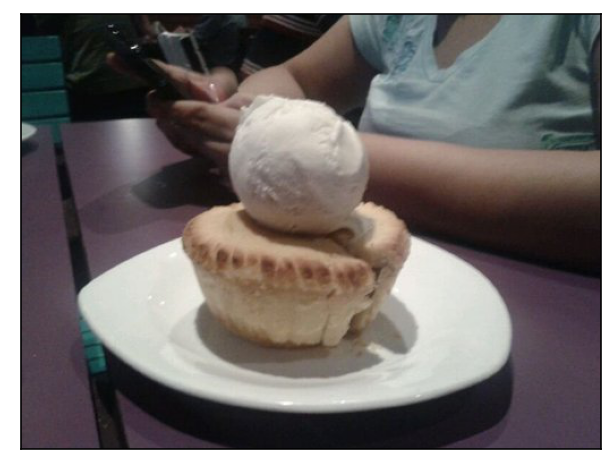

Predict:\<b\>a\<b\/\> ['beignets', 'macarons', 'apple_pie', 'donuts', 'pancakes']


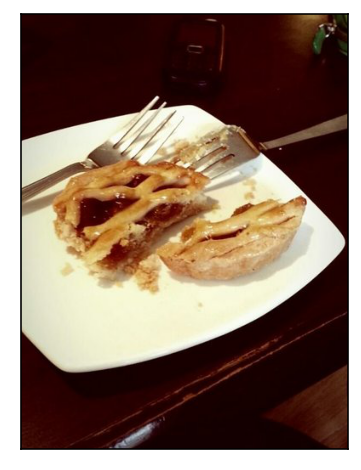

Predict:\<b\>a\<b\/\> ['apple_pie', 'carrot_cake', 'baklava', 'bread_pudding', 'lasagna']


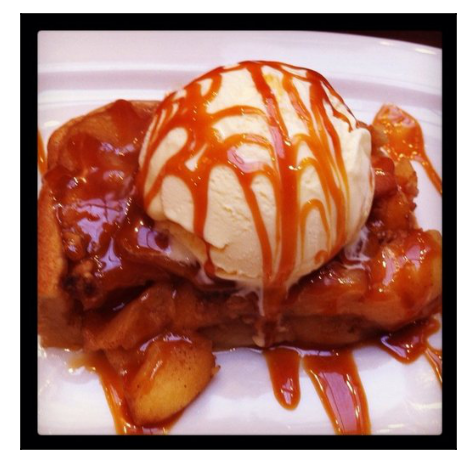

Predict:\<b\>a\<b\/\> ['takoyaki', 'chocolate_cake', 'peking_duck', 'apple_pie', 'foie_gras']


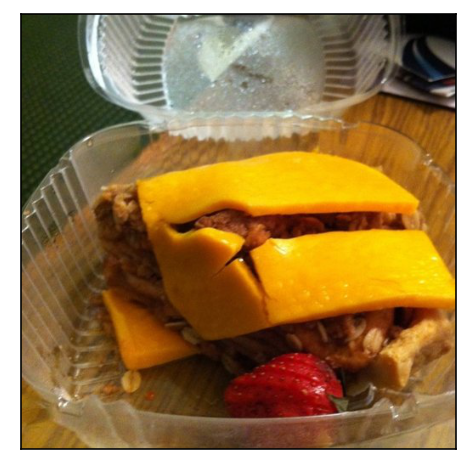

Predict:\<b\>a\<b\/\> ['waffles', 'grilled_cheese_sandwich', 'baklava', 'hamburger', 'club_sandwich']


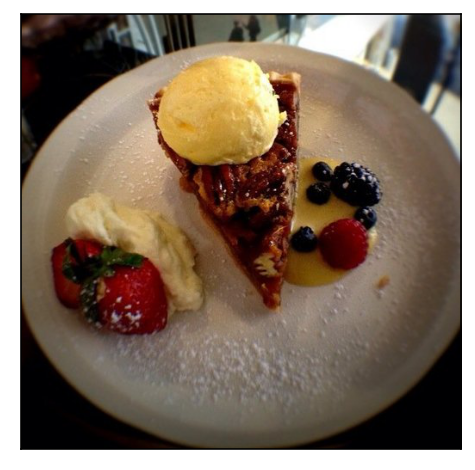

Predict:\<b\>a\<b\/\> ['panna_cotta', 'waffles', 'cannoli', 'chocolate_cake', 'creme_brulee']


KeyboardInterrupt: 

In [78]:
diy_path = os.path.join(data_path, 'test/apple_pie')
for img_name in os.listdir(diy_path):
    if '.DS_Store' in img_name: continue
    img_path = os.path.join(diy_path, img_name)
    img = cv2.imread(img_path)
    plt.imshow(img[...,::-1])    # bgr 转为 rgb
    plt.xticks([])
    plt.yticks([])
    plt.show()

    results = predict(img_path)
    print('Predict:', results)